In [85]:
import os,sys
sys.path.append('./../../../open_AR_Sandbox/')
sys.path.append('./../../../gempy-1.16/')
import sandbox.sandbox as sb
import matplotlib.pyplot as plt 
import numpy
import numpy as np
import pandas as pd
import pykinect2
import panel as pn
import matplotlib
pn.extension()
from bokeh.plotting import figure, show, output_file
import cv2
from cv2 import aruco
import scipy.spatial.distance as cdist

In [86]:
#calib = sb.CalibrationData(file = 'daniel_calibration.json')
calib = sb.CalibrationData(file = 'daniel_projector_calibration.json')
kinect = sb.KinectV2(calib)

#sensor = sb.DummySensor(calib, depth_limits=(500,2000))
sensor = sb.KinectV2(calib)
projector = sb.Projector(calib)
module = sb.CalibModule(calib, sensor, projector)
marker = sb.ArucoMarkers(sensor)
auto = sb.AutomaticModule(calib, sensor, projector)


JSON configuration loaded.
KinectV2 initialized.
KinectV2 initialized.


Projector initialized and server started.
Please position the browser window accordingly and enter fullscreen!


In [88]:
module.setup()

In [97]:
module.run()

Thread already running.


In [98]:
module.stop()

Thread stopped.


Tabs
    [0] Column
        [0] Markdown(str)
        [1] WidgetBox(css_classes=['widget-box'])
            [0] IntSlider(end=780, name='Main frame top margin', value=46)
            [1] IntSlider(end=1260, name='Main frame left margin', value=94)
            [2] IntSlider(end=1280, name='Main frame width', start=10, value=1006)
            [3] IntSlider(end=800, name='Main frame height', start=10, value=740)
            [4] Checkbox(name='Enable Automatic C..., value=True)
            [5] Button(button_type='success', clicks=1, name='Run')
    [1] Column
        [0] Markdown(str)
        [1] Row
            [0] WidgetBox(css_classes=['widget-box'])
                [0] Markdown(str)
                [1] IntSlider(bar_color='#084C61', end=424, name='Sensor top margin', start=1, value=160)
                [2] IntSlider(bar_color='#084C61', end=512, name='Sensor right margin', start=1, value=103)
                [3] IntSlider(bar_color='#084C61', end=424, name='Sensor bottom margin', start=1, value=51)
                [4] IntSlider(bar_color='#084C61', end=512, name='Sensor left margin', start=1, value=133)
                [5] Checkbox(name='Enable Automatic C..., value=True)
                [6] Button(button_type='success', clicks=1, name='Crop')
                [7] VSpacer(height=5)
                [8] Markdown(str)
                [9] IntSlider(bar_color='#DBD053', end=2000, name='Vertical minimum', value=841)
                [10] IntSlider(bar_color='#DB3A34', end=2000, name='Vertical maximum', value=1500)
                [11] Button(name='Refresh sensor f...)
            [1] Matplotlib(Figure, height=335)
    [2] Column
        [0] Markdown(str)
        [1] Row
            [0] WidgetBox(css_classes=['widget-box'])
                [0] Markdown(str)
                [1] IntSlider(bar_color='#084C61', end=2000, name='width of sandbox in mm', start=1, value=1000)
                [2] IntSlider(bar_color='#084C61', end=2000, name='height of sandbox in mm', start=1, value=800)
            [1] Matplotlib(Figure, height=335)
    [3] WidgetBox(css_classes=['widget-box'])
        [0] TextInput(name='Choose a calibration f..., value='calibration.json')
        [1] Button(name='Save calibration')
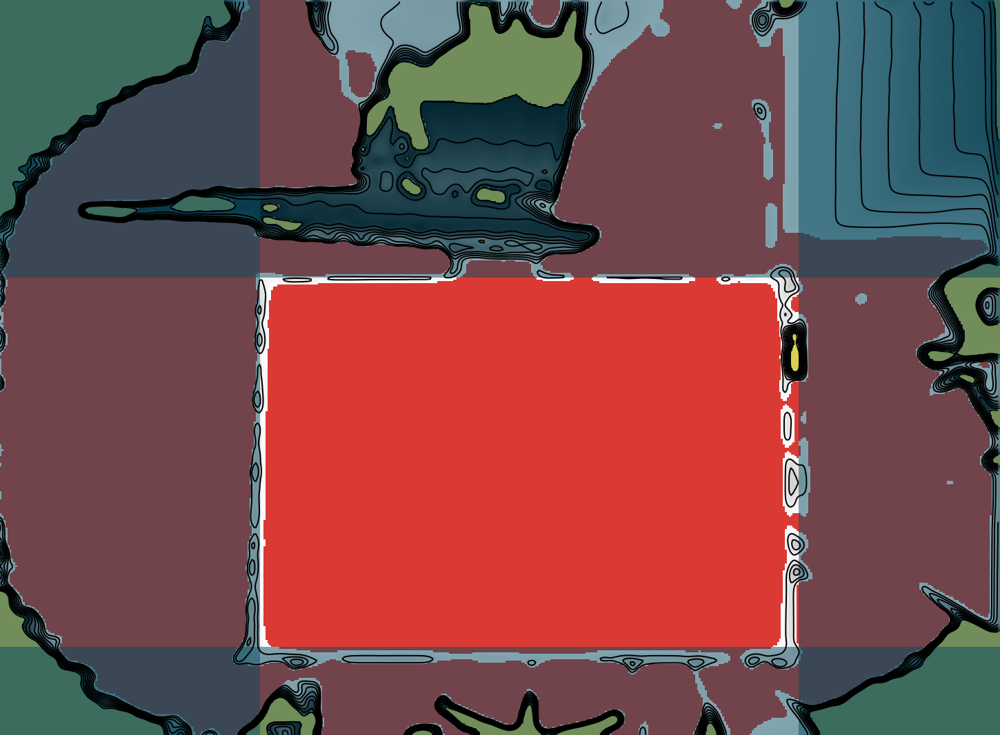
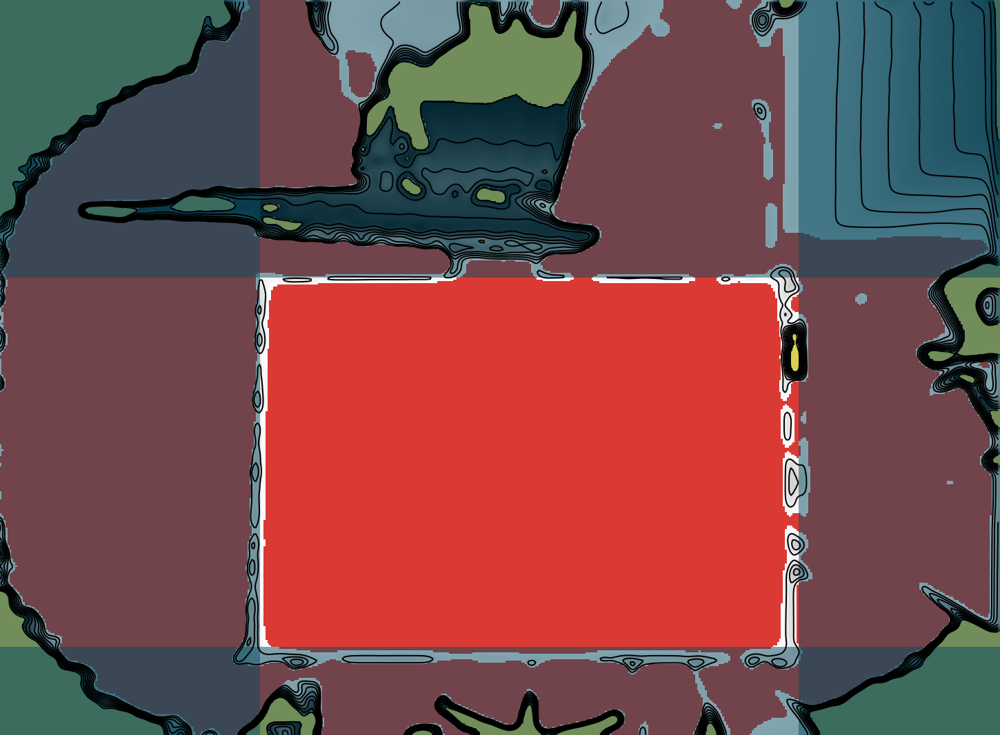

In [99]:
module.calibrate()

In [ ]:
marker.plot_aruco_location('RGB')

In [ ]:
id2 = marker.convert_color_to_depth('Real', 2, auto.CoordinateMap)
id15 = marker.convert_color_to_depth('Real', 15, auto.CoordinateMap)
id5 = marker.convert_color_to_depth('Real', 5, auto.CoordinateMap)
id1 = marker.convert_color_to_depth('Real', 1, auto.CoordinateMap)


In [ ]:
plt.figure(figsize = (20,20))
plt.imshow(sensor.get_ir_frame())
plt.plot(auto.marker.CoordinateMap.Depth_x, auto.marker.CoordinateMap.Depth_y, 'r.', lw =0, alpha = 0.2)
plt.plot(id2.Depth_x,id2.Depth_y, 'ro')
plt.plot(id15.Depth_x,id15.Depth_y, 'ro')
plt.plot(id5.Depth_x,id5.Depth_y, 'ro')
plt.plot(id1.Depth_x,id1.Depth_y, 'ro')

In [ ]:
plt.figure(figsize = (20,20))
plt.imshow(sensor.get_color())
plt.plot(auto.marker.CoordinateMap.Color_x, auto.marker.CoordinateMap.Color_y, 'r.', lw =0, alpha = 0.2)
plt.plot(id2.Color_x,id2.Color_y, 'bo')
plt.plot(id15.Depth_x,id15.Depth_y, 'bo')
plt.plot(id5.Depth_x,id5.Depth_y, 'bo')
plt.plot(id1.Depth_x,id1.Depth_y, 'bo')

In [ ]:
marker.find_markers_ir(amount = 4)

In [ ]:
marker.plot_aruco_location('IR')

In [93]:
marker.find_markers_rgb(amount=1)

,ids,Corners_RGB_x,Corners_RGB_y
0,1,1073,662


In [60]:
marker.create_CoordinateMap()

,Depth_x,Depth_y,Depth_Z(mm),Color_x,Color_y,Camera_x(m),Camera_y(m),Camera_z(m)
0,214,15,1324,882,-54,-0.151767,0.687357,1.324
1,215,15,1321,885,-54,-0.147850,0.685780,1.321
2,216,15,1317,888,-54,-0.143840,0.683685,1.317
3,217,15,1316,891,-54,-0.140171,0.683147,1.316
4,218,15,1315,894,-54,-0.136508,0.682611,1.315
...,...,...,...,...,...,...,...,...
187505,503,423,863,1793,1196,0.624522,-0.546739,0.863
187506,504,423,931,1792,1197,0.677207,-0.590468,0.931
187507,505,423,895,1798,1197,0.654377,-0.568266,0.895
187508,506,423,910,1802,1198,0.668770,-0.578438,0.910


In [33]:
mapper = marker.CoordinateMap

In [95]:
after_mapped = marker.convert_color_to_depth('Real',1,mapper)
after_mapped

Depth_x         285.000000
Depth_y         262.000000
Depth_Z(mm)    1584.000000
Color_x        1072.000000
Color_y         662.000000
Camera_x(m)       0.122599
Camera_y(m)      -0.235382
Camera_z(m)       1.584000
Name: 117435, dtype: float64

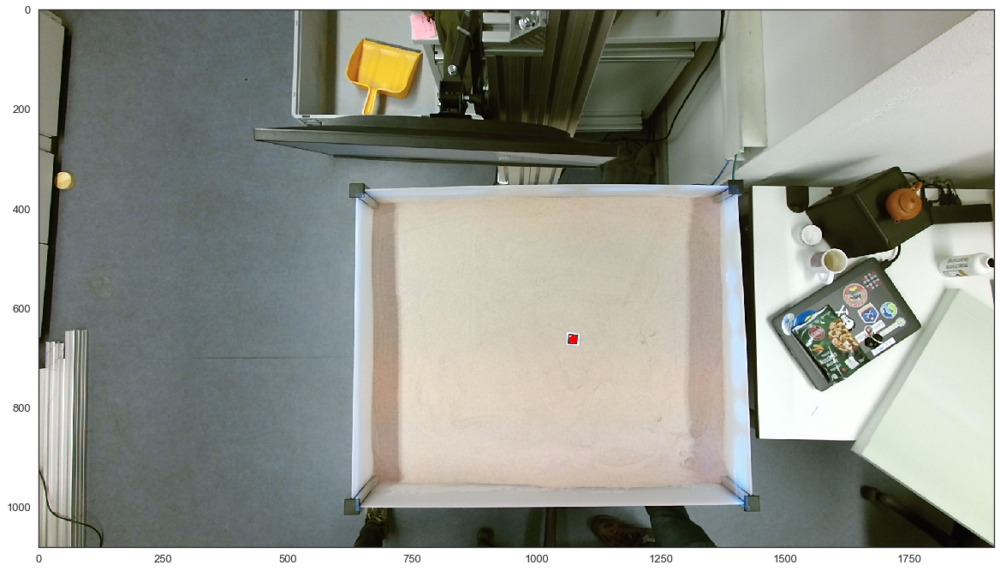

In [94]:
marker.plot_aruco_location('RGB')

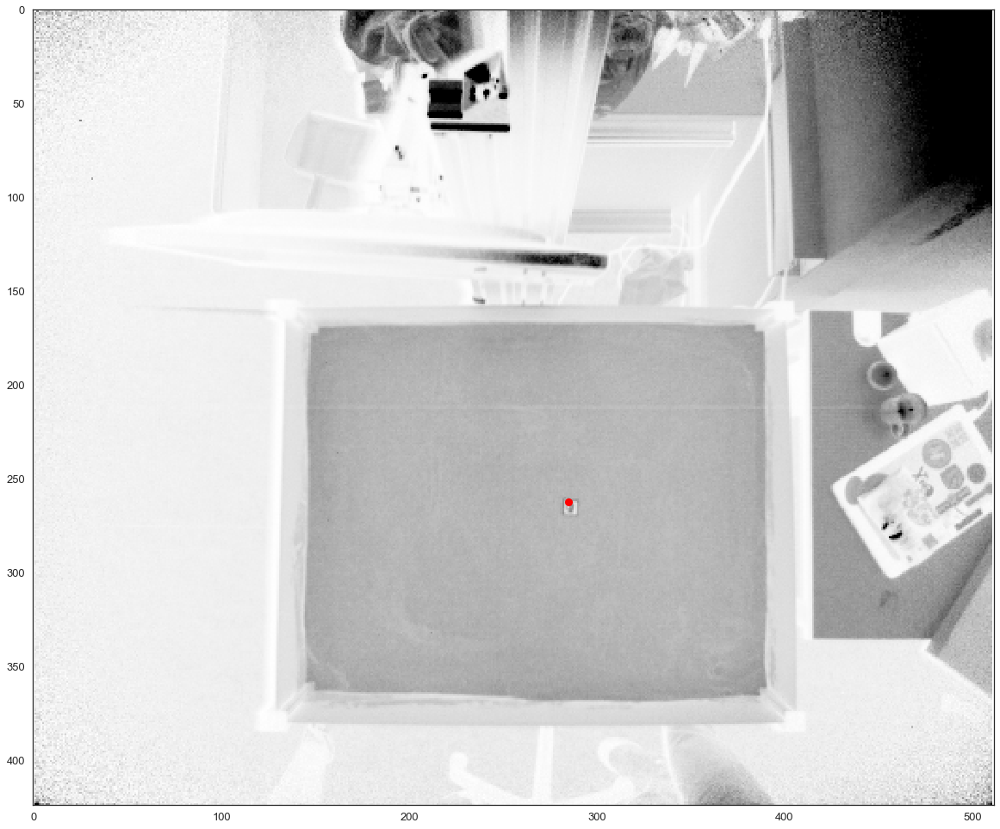

In [96]:
plt.figure(figsize = (20,20))
plt.imshow(sensor.get_ir_frame())
plt.plot(after_mapped.Depth_x, after_mapped.Depth_y, 'ro')

1577

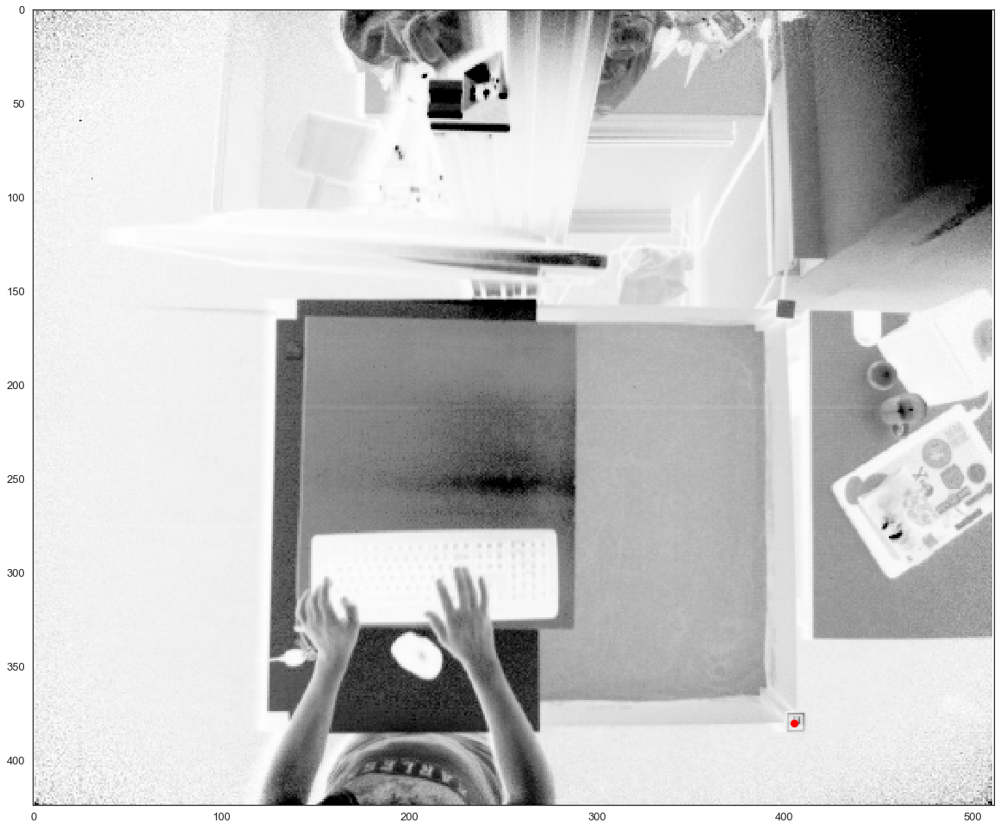

In [82]:
plt.figure(figsize = (20,20))
z_point = sensor.get_frame()
plt.imshow(sensor.get_ir_frame())
x = 405
y = 380
plt.plot(x, y, 'ro')
z_point[y][y]

In [38]:
marker.rgb_markers

,ids,Corners_RGB_x,Corners_RGB_y
0,1,1401,356


In [83]:
point = pykinect2.PyKinectV2._DepthSpacePoint(x, y)
col = sensor.device._mapper.MapDepthPointToColorSpace(point, z_point[y][x])
#cam = sensor.device._mapper.MapDepthPointToCameraSpace(point, z_point)

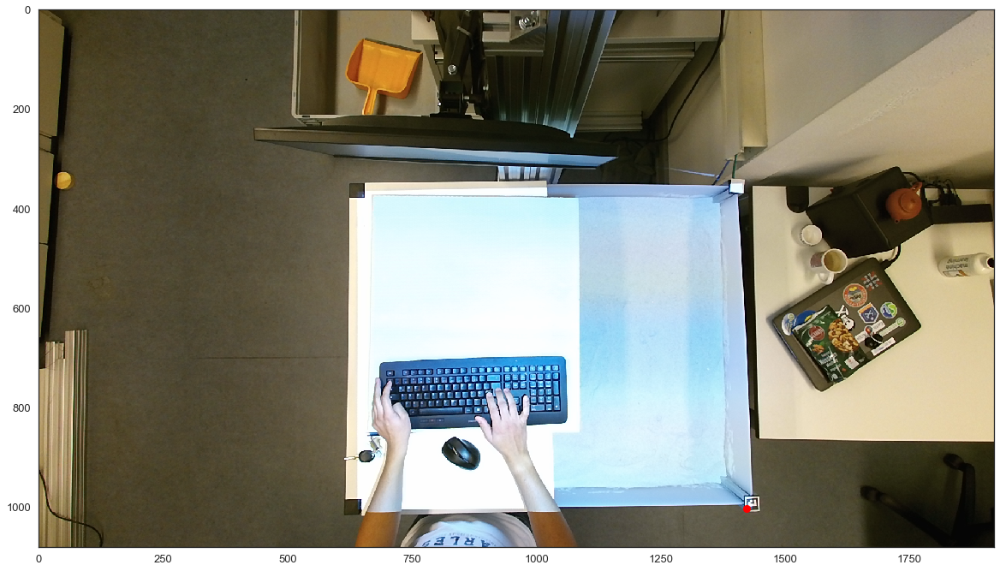

In [84]:
plt.figure(figsize = (20,20))
plt.imshow(sensor.get_color())
plt.plot(col.x+8,col.y-65, 'ro')

In [ ]:
col.y

In [ ]:
module.setup()

In [ ]:
module.run()

In [ ]:
module.stop()

In [ ]:
marker.rgb_markers = auto.rgb_corners

In [ ]:
auto.crop_image_aruco()

In [ ]:
x = marker.convert_color_to_depth('Real', 2)

In [ ]:
type(x.Depth_y)

In [ ]:
module._callback_automatic_calibration(1)

In [ ]:
df_p, corner = marker.find_markers_projector(amount=2)

In [ ]:
df_r = auto.rgb_corners

In [ ]:
x_c = df_r.Corners_RGB_x.mean()
y_c = df_r.Corners_RGB_y.mean()
print(x_c, y_c)

In [ ]:
x_pc = int(df_p.loc[df_p.ids == 20].Corners_projector_x.values)
y_pc = int(df_p.loc[df_p.ids == 20].Corners_projector_y.values)
print(x_pc, y_pc)

In [ ]:
cor = numpy.asarray(corner)
scale_factor_x = 100 / (cor[:, 0].max() - cor[:, 0].min())
scale_factor_y = 100 / (cor[:, 1].max() - cor[:, 1].min())
print(scale_factor_x,scale_factor_y)

In [ ]:
width_move = int((x_c - x_pc) * scale_factor_x)
height_move = int((y_c - y_pc) * scale_factor_y)
print(width_move,height_move)

In [ ]:
p_frame_width = calib.p_frame_width + width_move
p_frame_height = calib.p_frame_height + height_move
print(p_frame_width,p_frame_height)

In [ ]:
error = (numpy.abs( x_c - x_pc) and numpy.abs(y_c - y_pc)) <= 5
print(error)

In [ ]:
auto.move_middle()

In [ ]:
auto.move_leftupper_corner()

In [ ]:
module.auto.marker.projector_markers

In [ ]:
module.auto.marker.plot_aruco_location('Projector')

In [ ]:
df_p, corner = marker.find_markers_projector(amount=2)
x_p = int(df_p.loc[df_p.ids == 2].Corners_projector_x.values)
y_p = int(df_p.loc[df_p.ids == 2].Corners_projector_y.values)

df_r = auto.rgb_corners

x_r = int(df_r.loc[df_r.ids == 2].Corners_RGB_x.values)
y_r = int(df_r.loc[df_r.ids == 2].Corners_RGB_y.values)

cor = numpy.asarray(corner)
scale_factor_x = 100 / (cor[:,0].max() - cor[:,0].min())
scale_factor_y = 100 / (cor[:,1].max() - cor[:,1].min())

x_move = int(((x_p - x_r) * scale_factor_x)) - 20 - 25
y_move = int(((y_p - y_r) * scale_factor_y)) - 20 - 25

p_frame_left = calib.p_frame_left - x_move
p_frame_top = calib.p_frame_top - y_move

x_c = df_r.Corners_RGB_x.mean()
y_c = df_r.Corners_RGB_y.mean()

x_pc = int(df_p.loc[df_p.ids == 20].Corners_projector_x.values)
y_pc = int(df_p.loc[df_p.ids == 20].Corners_projector_y.values)

width_move = int((x_c - x_pc)*scale_factor_x + x_move)
height_move = int((y_c - y_pc)*scale_factor_y + y_move)

p_frame_width = calib.p_frame_width + width_move
p_frame_height = calib.p_frame_height + height_move

print(p_frame_left, p_frame_top, p_frame_width, p_frame_height)

In [ ]:
(numpy.abs(x_p - x_r))# and numpy.abs(p_frame_top-y_r)) <= 5

In [ ]:
df_p, corner = marker.find_markers_projector(amount=2)
x_p = int(df_p.loc[df_p.ids == 20].Corners_projector_x.values)
y_p = int(df_p.loc[df_p.ids == 20].Corners_projector_y.values)
print(x_p,y_p)

In [ ]:
p_frame_left+x_move

In [ ]:
p_frame_left

In [ ]:
x_move

In [ ]:
df_r = auto.rgb_corners
x_r = int(df_r.loc[df_r.ids == 2].Corners_RGB_x.values)
y_r = int(df_r.loc[df_r.ids == 2].Corners_RGB_y.values)
print(x_r,y_r)

In [ ]:
cor = numpy.asarray(corner)
scale_factor_x = 100/(cor[:,0].max() - cor[:,0].min())
scale_factor_y =  100/(cor[:,1].max() - cor[:,1].min())
print(scale_factor_x,scale_factor_y)

In [ ]:
int(calib.p_frame_left - (numpy.abs(x_p - x_r) * scale_factor_x) + 20 + 10)

In [ ]:
cor

In [ ]:
cor[:,0]

In [ ]:
loc = marker.find_markers_rgb(amount=4)
marker.plot_aruco_location('RGB')

In [ ]:
calib.aruco_corners = loc.to_json()

In [ ]:
loc

In [ ]:
calib.aruco_corners

In [ ]:
calib.corners_as_json(loc)

In [ ]:
calib.save_json(file = 'daniel_aruco_calibration.json')

In [ ]:
df , c =marker.find_markers_projector(amount=2)
df

In [ ]:
df , c =marker.find_markers_projector(amount=2)
df

In [ ]:
module.auto.marker.plot_aruco_location('Projector')

In [ ]:
845-838

In [ ]:
calib.aruco_corners

In [ ]:
c = auto.rgb_corners

In [ ]:
c.Corners_RGB_x.mean()

In [ ]:
(2 and 4) < 5